In [1]:
using Pkg
venv_dir = (@__DIR__) * "/../../muc_venv"
Pkg.activate(venv_dir)

using Revise
using LinearAlgebra
using LaTeXStrings
using DelimitedFiles: readdlm
using DataFrames
using CSV
using Interpolations
using PythonPlot
using PythonCall
mpl = pyimport("matplotlib")
pe = pyimport("matplotlib.patheffects")
using NaturallyUnitful

rc("font", family="serif", serif="Computer Modern", size=14)
rc("figure", autolayout=true)
rc("axes", labelsize=16, unicode_minus=false)
rc("text", usetex=true)
rc("text.latex", preamble=raw"\usepackage{slashed}")

golden_ratio = (1+sqrt(5))/2
to_cm_ns = ustrip(unnatural(u"cm*ns^-1", 1))
GeV_to_ns = ustrip(unnatural(u"ns", 1*u"GeV^-1"))
ccms = ustrip(unnatural(u"cm*s^-1", 1))

FIGDIR = "./"
DATA_DIR = "./LL_model_data/"

# make sure these match what the script has output
MG_RESULTS_DIR = "/home/aradick/Dropbox (University of Oregon)/research/personal/flavorDM2_datas/LL_dynamic/" # insert path to madgraph results directories
DIR_mumu_LR = "mumu_to_phiphi_LR/"
DIR_mumu_RL = "mumu_to_phiphi_RL/"
DIR_VV = "VV_to_phiphi/"

RUN_RESULTS_FILENAME = "run_info.csv"
SUMMARY_FILENAME = "diphi_summary.csv"
;

  Activating project at `~/Dropbox (University of Oregon)/research/flavorDM2/Aria/muc_venv`


In [2]:
includet(venv_dir*"/"*"LLP_utils.jl")
using .LLP_Utils
;

In [3]:
mφ_for_bounds = readdlm(DATA_DIR*"mphi_for_mchi_bounds.csv")[:]
mχ_upper = readdlm(DATA_DIR*"mchi_uppers.csv")[:]

mphi_grid = readdlm(DATA_DIR*"mphis_grid.csv")[:]
mchi_grid = readdlm(DATA_DIR*"mchis_grid.csv")[:]
Γ_φm = readdlm(DATA_DIR*"LL_phim_totwidth_GeV.csv")
tauphi = GeV_to_ns ./ Γ_φm[1:end-1,:]
;

In [4]:
run_infos = get_runs_info(MG_RESULTS_DIR, DIR_mumu_LR, DIR_mumu_RL, DIR_VV);

In [5]:
nopdf_info = nopdf_run_info(run_infos);

In [6]:
data_loc = "/home/aradick/Dropbox (University of Oregon)/research/flavorDM2/Aria/relic_abundance/LL_model/data/"
mχ_prompt = readdlm(data_loc*"L_mchi_prompt_boundary.csv")[:]
Mphis_hscp = readdlm(data_loc*"L_mphi_hscp.csv")[:]
mchi_hscp = readdlm(data_loc*"L_mchi_hscp.csv")[:]
mchi_hscp_up = readdlm(data_loc*"L_mchi_hscp_upper.csv")[:]
seR_mphis = readdlm(data_loc*"L_mphi_for_seR.csv")[:]
seR_lo_mχ = readdlm(data_loc*"L_seR_lower.csv")[:]
seR_hi_mχ = readdlm(data_loc*"L_seR_upper.csv")[:]
;

In [12]:
function make_money(events_in_detector)
    hscpi = (mchi_hscp .> 0.0)

    eid = events_in_detector
    title = L"Number of Expected Events ($L$ Model)"

    fig, axs = subplots(4,2,figsize=(10,12))

    mphi_plot = 10 .^ range(log10(eid.mphis[1]), log10(eid.mphis[end]), 100)
    mchi_plot = 10 .^ range(log10(eid.mchis[1]), log10(eid.mchis[end]), 100)

    cmap = mpl.cm.Purples
    bounds = -1.0:1.0:3.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")
    
    idx = 1
    for ax in axs
        for a in ax
            q = transpose(sum(eid.N_exp[idx,:,:,:];dims=2)[:,1,:])

            g = a.pcolormesh(eid.mchis, eid.mphis, log10.(q), norm=norm,
                            cmap=cmap)
            a.fill_betweenx(mφ_for_bounds, mχ_upper, 1e4, color="gainsboro", 
                            zorder=2)

            a.fill_betweenx(Mphis_hscp[hscpi], mchi_hscp[hscpi], mchi_hscp_up[hscpi], 
                        edgecolor="xkcd:neon pink", facecolor="none")
            
            a.fill_betweenx(seR_mphis, seR_lo_mχ, seR_hi_mχ, edgecolor="xkcd:neon green",
                            facecolor="none")
            
            formatter(l) = L"10^{ %$(Int(l)) }"

            a.set_xscale("log")
            a.set_yscale("log")
            a.set_xlim(eid.mchis[1], eid.mchis[end])
            a.set_ylim(1e2, eid.rts/2)
            cbar = fig.colorbar(g)
            cbar.ax.set_yticklabels(formatter.(bounds))
            a.set_title("Decays $(eid.labels[idx])")
            a.set_xlabel(L"$m_\chi$ [GeV]")
            a.set_ylabel(L"$m_\phi$ [GeV]")

            idx += 1
        end
    end

    fig.suptitle(title)

    plotclose()

    return fig
end

make_money (generic function with 1 method)

In [7]:
function make_money_τφ(eid)
    title = L"Number of Expected Events ($L$ Model)"
    # title = L"$\ell_R$ Model Number of Expected Events ($i = \mu \mu$ only)"

    fig, axs = subplots(4,2,figsize=(10,12))

    # mphi_plot = 10 .^ range(log10(eid_pdf.mphis[1]), log10(eid_pdf.mphis[end]), 100)

    cmap = mpl.cm.Purples
    bounds = -1.0:1.0:4.0
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")
    
    idx = 1
    for ax in axs
        for a in ax
            q = sum(eid.N_exp[idx,:,:,:];dims=2)[:,1,:]

            g = a.pcolormesh(1e-3 .* eid.mphis, eid.tauphis[1,:], log10.(q), norm=norm,
                            cmap=cmap)

            # a.fill_between(1e-3 .* Mphis_hscp, 1.0, 1e15, edgecolor="xkcd:neon pink", facecolor="none")
            
            # a.fill_between(1e-3 .* seR_mphis, 1e9*seR_lo_τφ, 1e9*seR_hi_τφ, edgecolor="xkcd:neon green",
            #                 facecolor="none")
            
            formatter(l) = L"10^{ %$(Int(l)) }"

            # a.set_xscale("log")
            a.set_yscale("log")
            a.set_ylim(eid.tauphis[1], eid.tauphis[end])
            a.set_xlim(1e-3 .* 1e2, 1e-3 .* eid.rts/2)
            cbar = fig.colorbar(g)
            cbar.ax.set_yticklabels(formatter.(bounds))
            a.set_title("Decays $(eid.labels[idx])")
            a.set_ylabel(L"$\tau_\phi$ [ns]")
            a.set_xlabel(L"$m_\phi$ [TeV]")

            a.grid(alpha=0.3)
            idx+=1
        end
    end

    fig.suptitle(title)

    plotclose()

    return fig
end

function money_diff(eid_nopdf, eid_pdf)
    fig = figure()

    # cmap = mpl.cm.Purples
    cmap = mpl.cm.magma_r
    # cmap = mpl.cm.cividis
    # cmap = mpl.cm.Blues
    # bounds = -4.0:1.0:0.0
    bounds = [0.01, 0.05, (0.1:0.2:1.0)...]
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend="both")

    q1 = sum(eid_nopdf.N_exp[1,:,:,:];dims=2)[:,1,:]
    q2 = sum(eid_pdf.N_exp[1,:,:,:];dims=2)[:,1,:]

    diff = @. abs((q1-q2)/q2)

    g = pcolormesh(1e-3 .* eid_pdf.mphis, eid_pdf.tauphis[1,:],
                diff, cmap=cmap, norm=norm)

    # formatter(l) = L"10^{ %$(Int(l)) }"
    formatter(l) = L"%$(round(Int,1e2*l)) \%"

    a = gca()

    # a.set_xscale("log")
    a.set_yscale("log")
    a.set_ylim(eid_pdf.tauphis[1], eid_pdf.tauphis[end])
    a.set_xlim(1e-3 .* 1e2, 1e-3 .* eid_pdf.rts/2)
    cbar = fig.colorbar(g)
    cbar.ax.set_yticklabels(formatter.(bounds))
    # a.set_title("Decays $(eid_pdf.labels[1])")
    a.set_ylabel(L"$\tau_\phi$ [ns]")
    a.set_xlabel(L"$m_\phi$ [TeV]")

    a.grid(alpha=0.3)

    title(L"Diffs ($L$ Model)")

    plotclose()

    return fig
end

money_diff (generic function with 1 method)

In [7]:
tauphis_money = 10 .^ range(-3, 4, 50);

In [12]:
eid1 = eid_tauphi(run_infos, 10e6, tauphis_money)

(N_exp = [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 242.4411132984404 242.4411132984404;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 97.71299056743695 97.71299056743695;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 201.12295496590943 201.12295496590943;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 79.5813156 79.5813156;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 1112.0001414646579 1112.0001414646579;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 451.5925967648644 451.5925967648644;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 958.5171617713067 958.5171617713067;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 386.68032975 386.68032975;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 6240.479986605411 6240.479986605411;;;; 0.0 0.0 … 0.0 0.0; 

In [13]:
eid2 = eid_tauphi(nopdf_info, 10e6, tauphis_money)

(N_exp = [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 458.76356250000003 458.76356250000003;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 2104.2022924999997 2104.2022924999997;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 6240.479986605411 6240.479986605411;;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 459.517377375 459.517377375;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 2103.3105530000003 2103.3105530000003;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 5965.95852778702 5965.95852778702;;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 460.39666800000003 460.39666800000003;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 2105.8114 2105.8114;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 5601.200878600114 5601.200878600114;;;; … ;;;; 0.0 0.0 

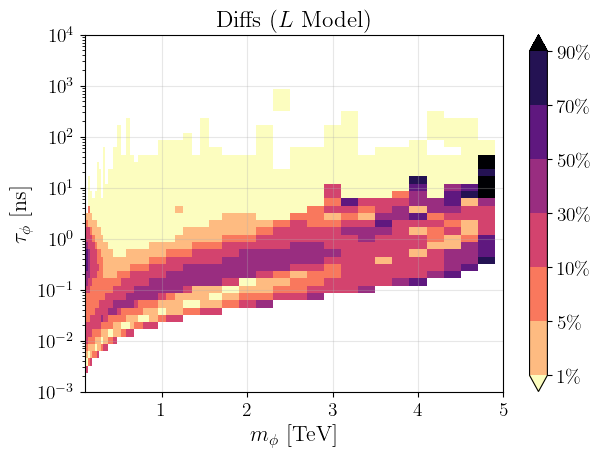

In [17]:
f = money_diff(eid2,eid1)
# f.savefig("money_diff.pdf")
f

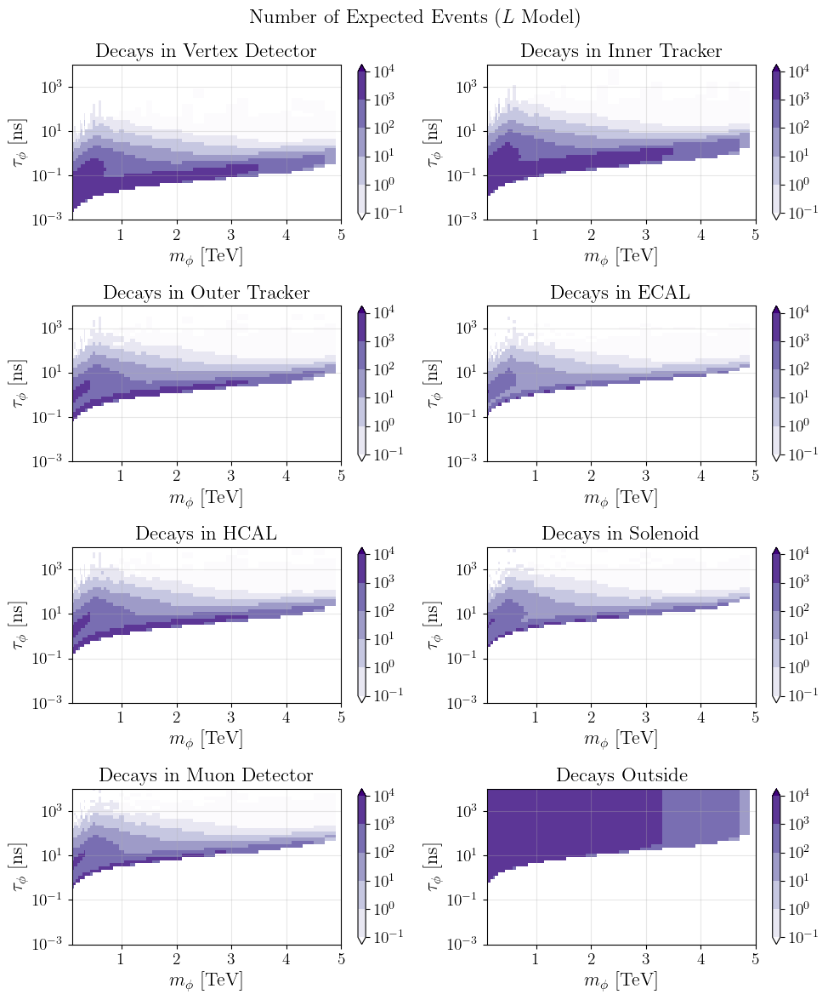

In [20]:
f = make_money_τφ(eid1)
f.savefig("LL_LLP_events.pdf", bbox_inches="tight")
f

In [8]:
eid_m = eid_mchi(run_infos, 10e6, mchi_grid, tauphi);

In [8]:
eid_m_nopdf = eid_mchi(nopdf_info, 10e6, mchi_grid, tauphi);

In [10]:
f = make_money(eid_m_nopdf)
# f.savefig("LL_LLP_events_mchi.pdf", bbox_inches="tight")
f

UndefVarError: UndefVarError: `eid_m_nopdf` not defined

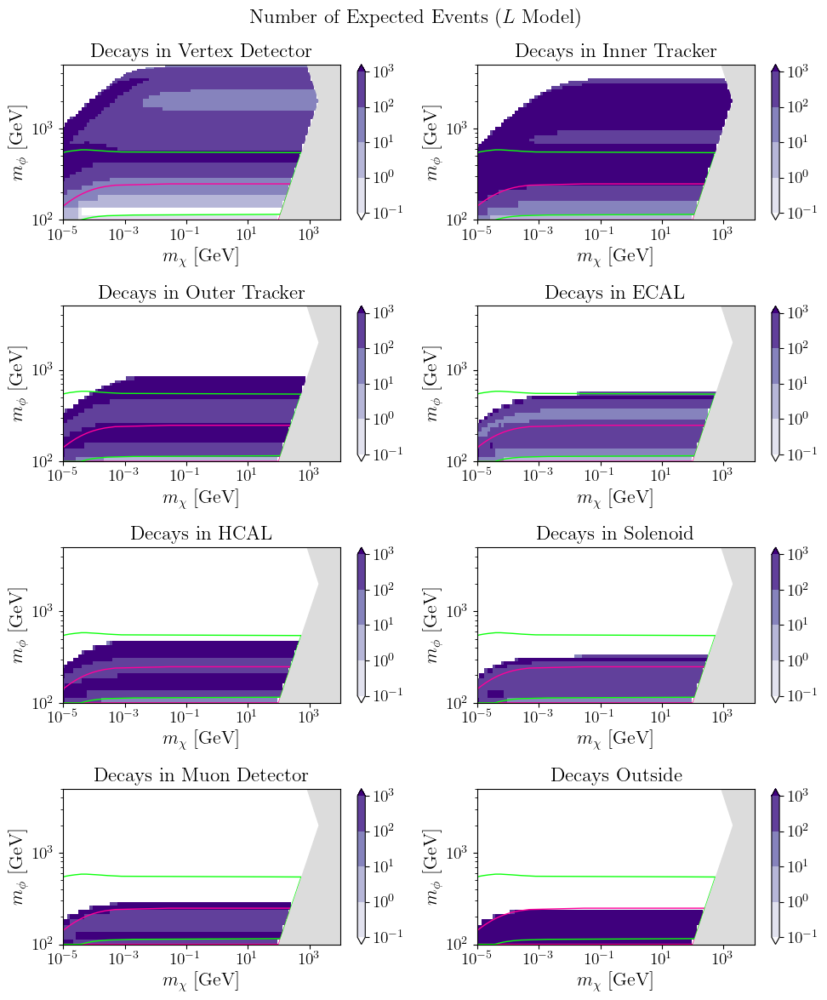

In [14]:
f = make_money(eid_m)
f.savefig("LL_LLP_events_mchi.png", bbox_inches="tight", dpi=400)
f